In [1]:
import numpy as np
import matplotlib.pyplot as plt

import torch
import rootutils
root = rootutils.setup_root("./scripts/", dotenv=True, pythonpath=True,  indicator =  [".project-root"], cwd = True)


from scripts.models import CustomGNN
from scripts.environment import Environment
from scripts.pruning import prune, get_quality

In [12]:

# load the data

positions = []
data = []
for i in range(10):
    positions.append(np.load(f"positions/random_{i}_positions.npy"))
    SMAD_ERK = np.load(f"positions/random_{i}_SMAD_and_ERK.npy")
    SMAD_ERK = SMAD_ERK.swapaxes(1, 2)

    # SMAD_ERK[:,:,0] *= 100.
    # SMAD_ERK[:,:,1] *= 100.

    d = SMAD_ERK[:101,:,:]
    data.append(d)

(1000, 9) (1000, 9)


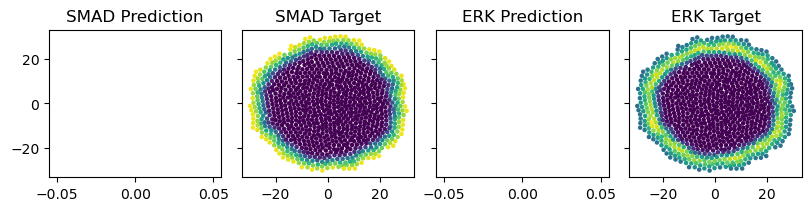

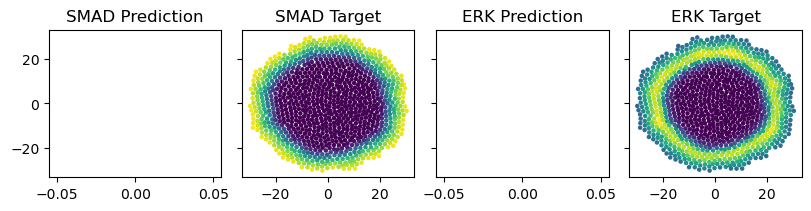

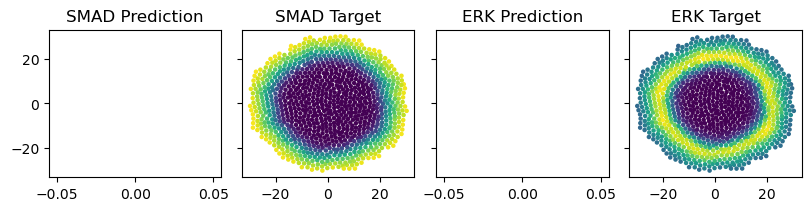

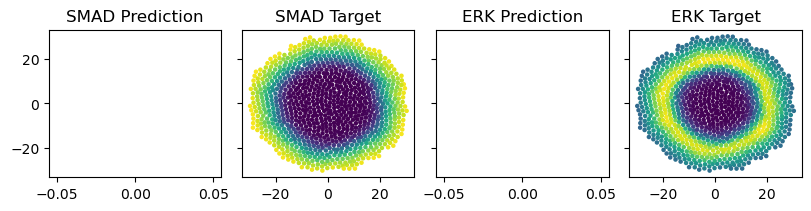

QUALITY before nan
(1000, 8) (1000, 8)


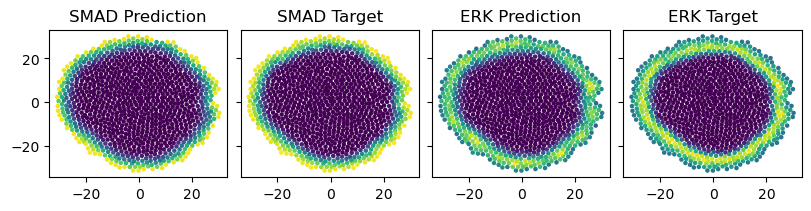

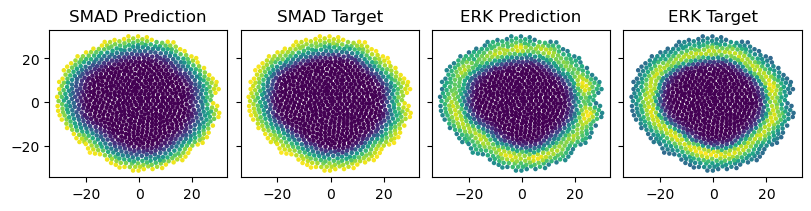

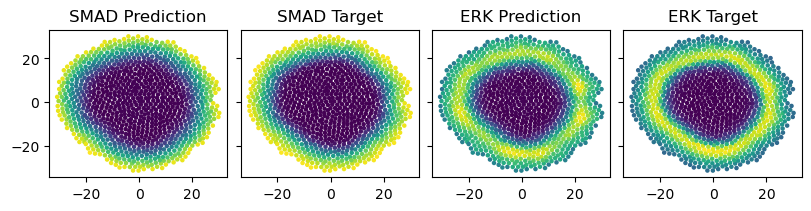

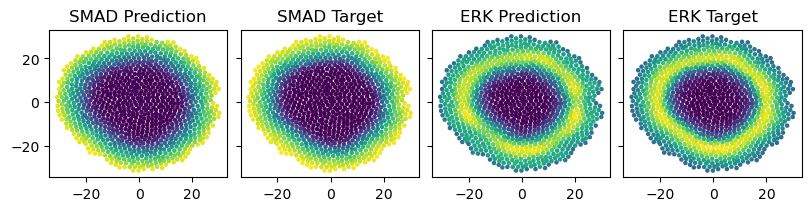

QUALITY before 4.115915899912706
(1000, 9) (1000, 9)


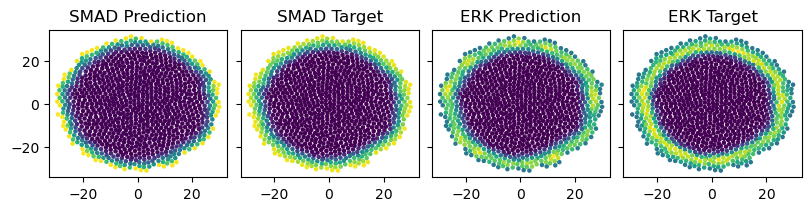

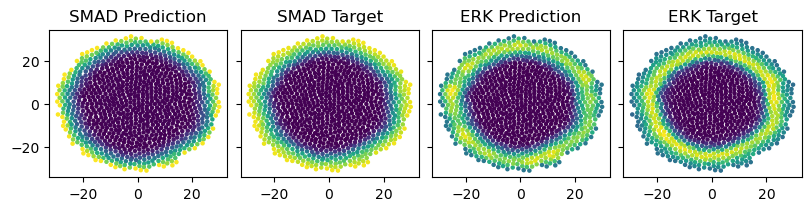

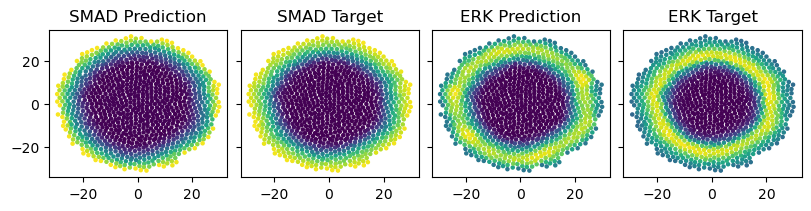

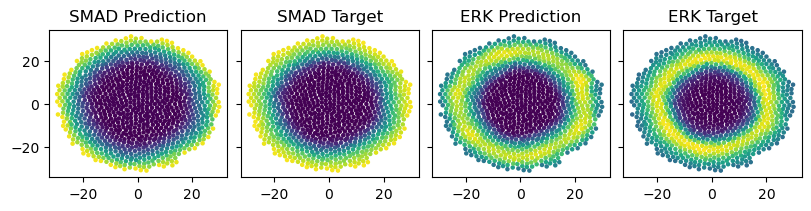

QUALITY before 4.7185141792490946
(1000, 9) (1000, 9)


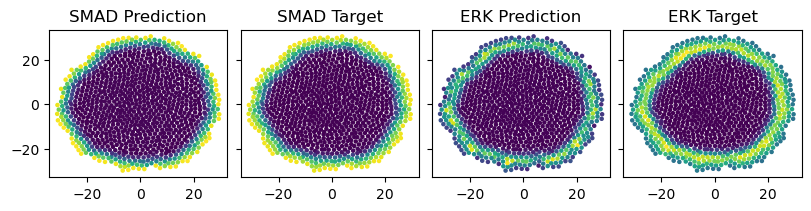

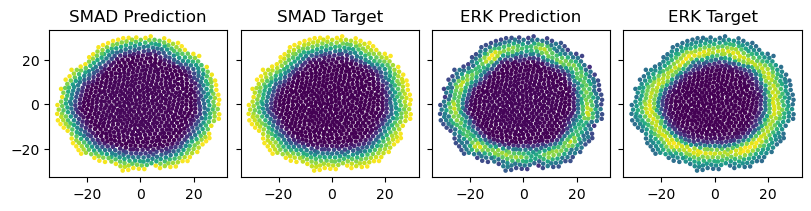

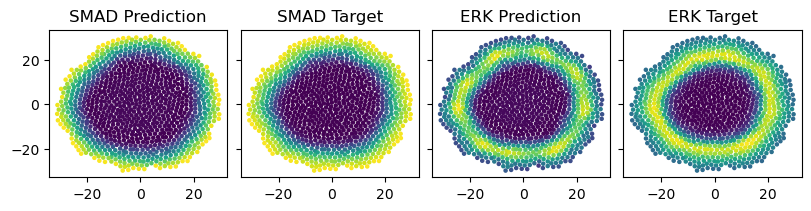

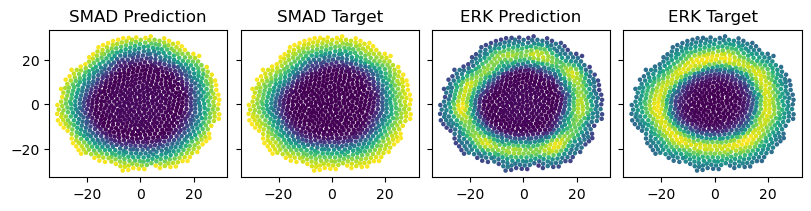

QUALITY before 4.103964409675842
(1000, 9) (1000, 9)


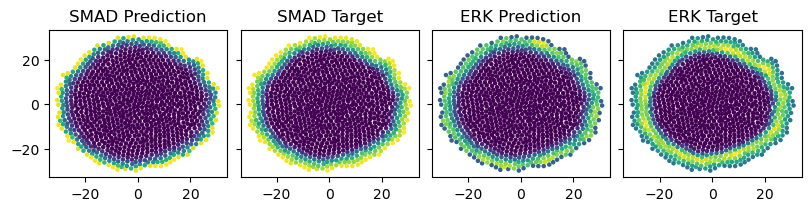

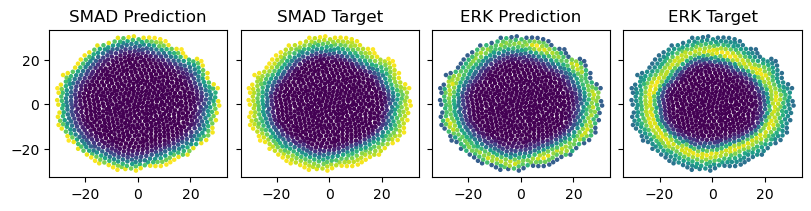

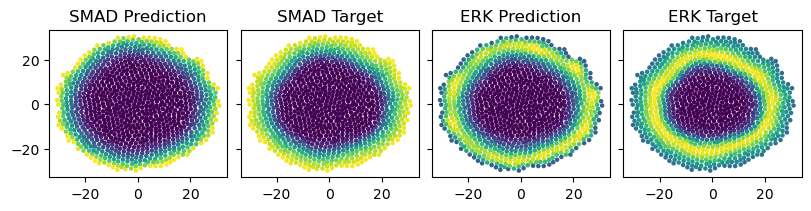

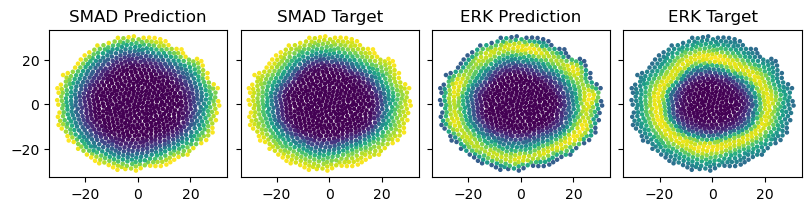

QUALITY before 6.318841470935842
(1000, 8) (1000, 8)


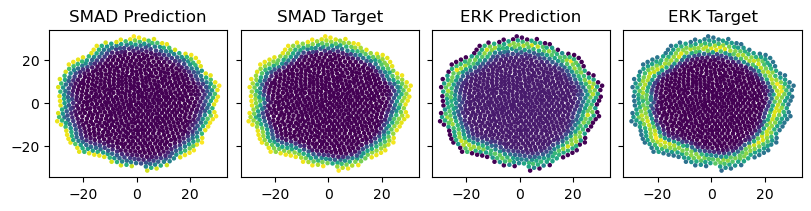

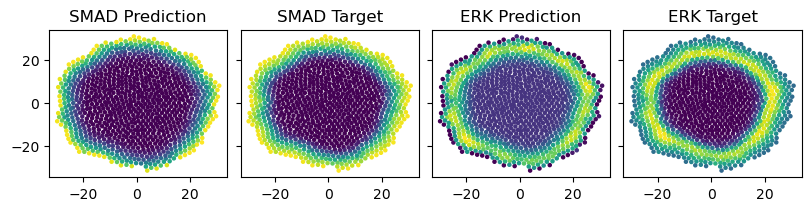

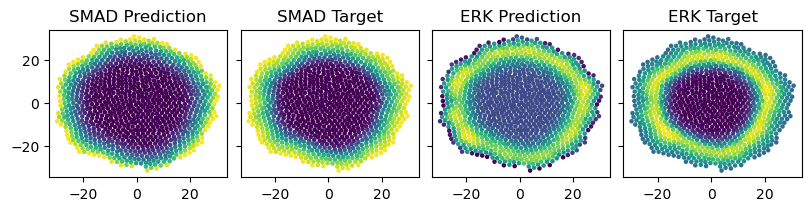

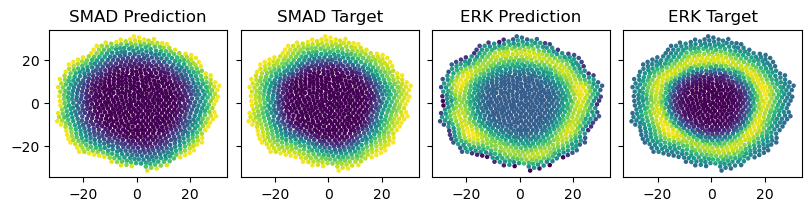

QUALITY before 6.455573477676413
(1000, 9) (1000, 9)


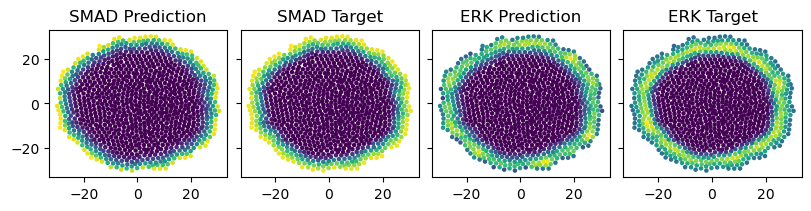

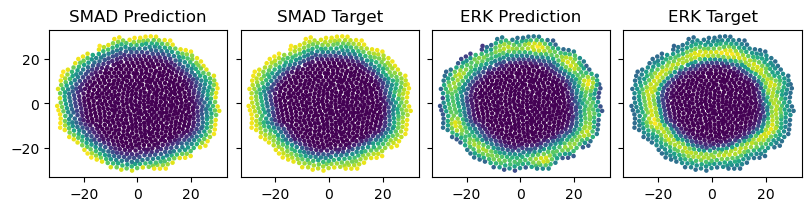

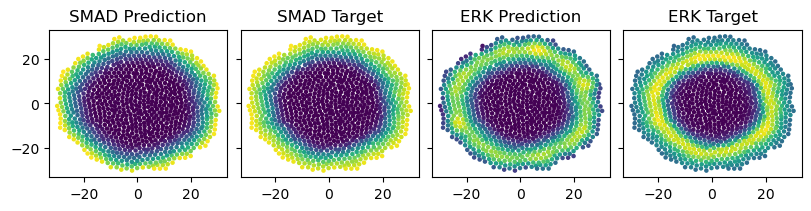

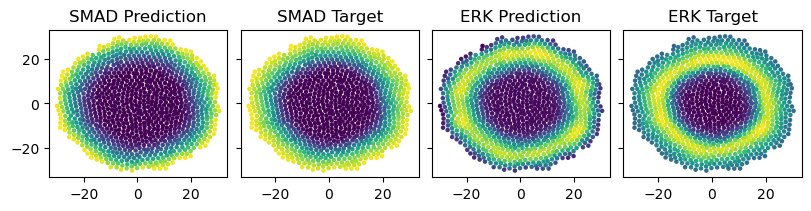

QUALITY before 5.4530780140323465
(1000, 9) (1000, 9)


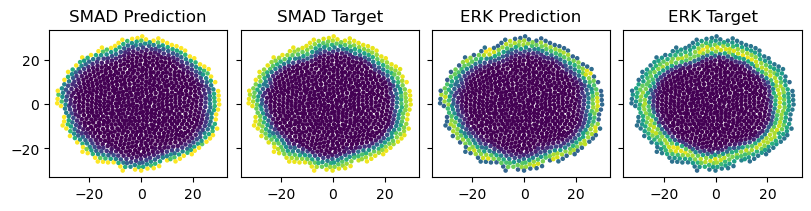

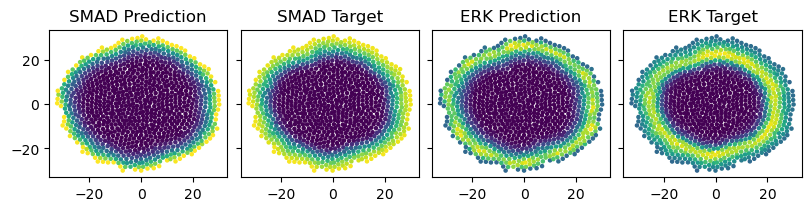

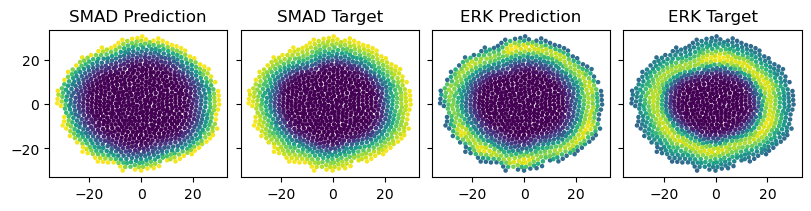

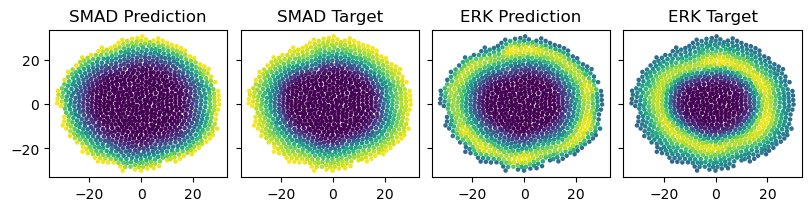

QUALITY before 6.400795710398942
(1000, 8) (1000, 8)


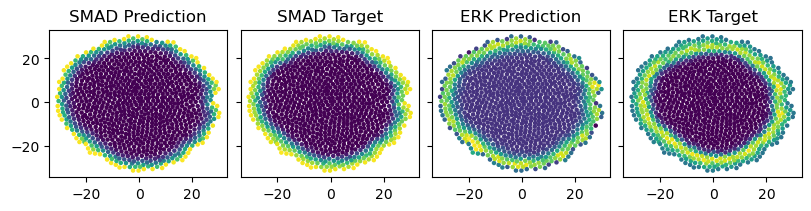

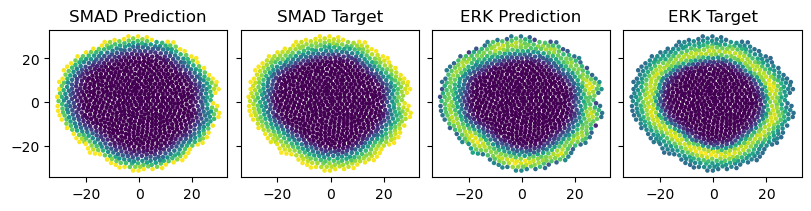

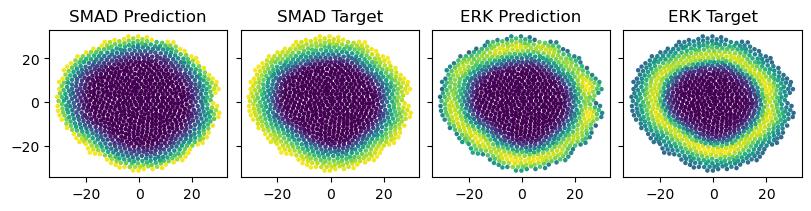

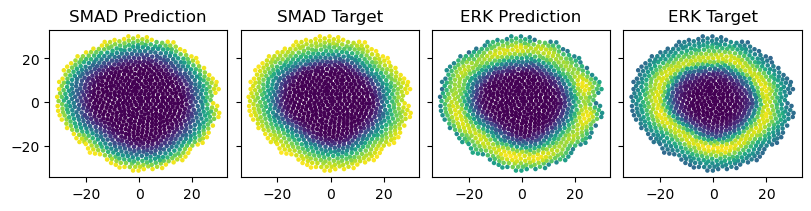

QUALITY before 6.108853003853597
(1000, 8) (1000, 8)


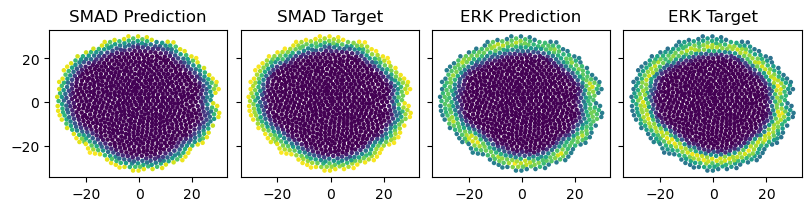

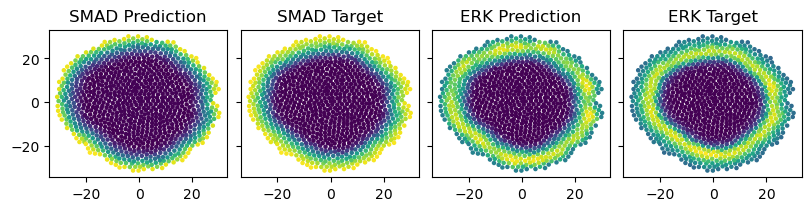

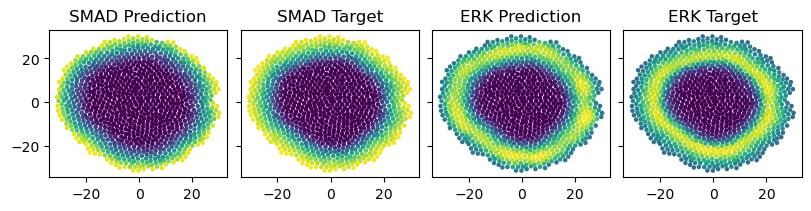

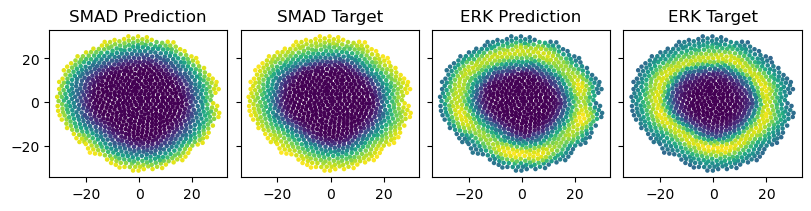

QUALITY before 4.70950853424333


In [14]:
for i in range(10):
    # load the model
    stepsize = 2

    path = f"model50{i}.pth"
    model = CustomGNN(3, [6], 2, aggregation="mean", biases = False)
    model.load_state_dict(torch.load(path))
    model.eval()


    qualb = get_quality(model, data, positions, stepsize, 4)
    print("QUALITY before", qualb)
# mask = prune(model, threshold = 0.01)
# w = model.get_weights()
# ww = [w.detach().numpy()*(~m) for w,m in zip(w, mask)]
# ww = [torch.nn.Parameter(torch.tensor(w)) for w in ww]
# model.set_weights(ww) 

# quala = get_quality(model, data, positions, stepsize, 4)
# print("QUALITY before", qualb)
# print("QUALITY after", quala)

(1000, 9) (1000, 9)
[array([[ 2.4906733e-05, -6.9746329e-06,  4.2214750e-05,  7.1537989e-04,
         5.1349169e-05, -1.2903874e-04],
       [ 5.2191824e-01, -3.4976439e-04,  1.6428837e-01, -9.8819655e-06,
        -5.2551825e-02,  5.3633950e-05],
       [ 2.1468128e-01,  5.6609116e-02, -7.2093898e-01,  6.4513129e-01,
        -9.7687461e-04,  3.1737398e-02],
       [-2.2752859e-02,  2.2527754e-04,  8.3288628e-01,  2.4626806e-04,
         1.5665230e-04,  4.4404931e-02],
       [-1.3293111e-05, -8.7905602e-05,  1.1656175e-04,  2.4118008e-05,
        -7.5243406e-07,  6.4903834e-06],
       [-6.0902357e-01,  6.1834538e-01,  4.0002819e-02,  3.9508840e-01,
         1.2561627e-01,  1.8030932e-04]], dtype=float32), array([[-2.4888135e-04,  6.1020130e-01,  7.9118389e-01,  5.4907948e-01,
         2.2734591e-04, -4.3434970e-04],
       [-1.0453503e-04, -1.4483745e-04,  3.2591939e-01,  2.3033127e-01,
        -1.2104269e-04,  1.3169860e+00]], dtype=float32)]
[6, 6, 2]


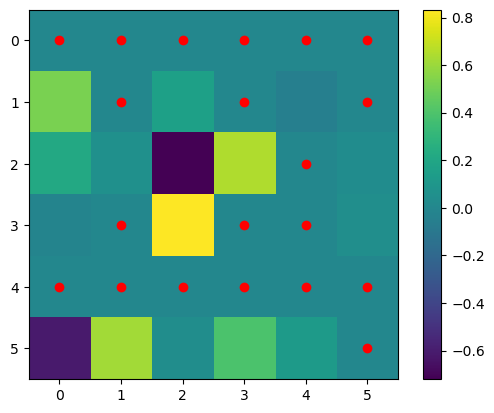

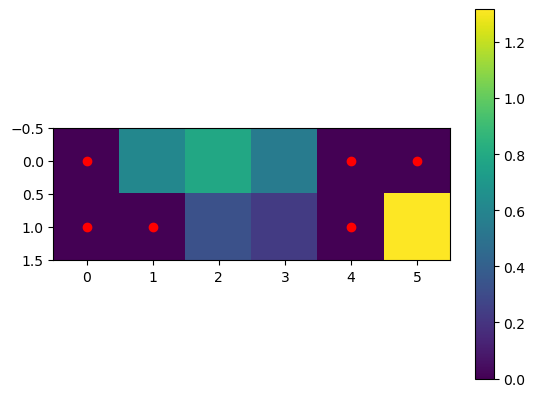

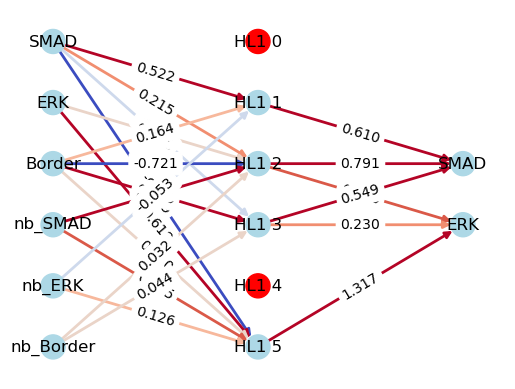

(1000, 9) (1000, 9)


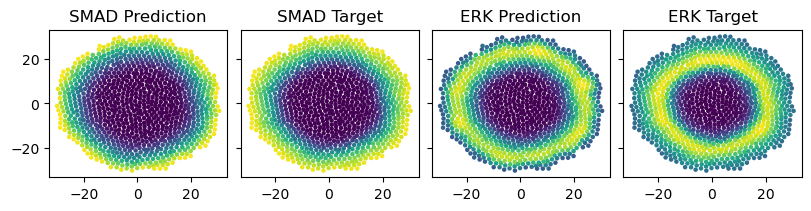

QUALITY before 5.07897816721553
QUALITY after 5.012132554695646
N-pruned 26
(1000, 9) (1000, 9)
[array([[ 3.4801203e-01,  5.4243083e-06,  8.9337336e-05,  3.5993162e-01,
         2.0444015e-04, -3.3763845e-06],
       [ 5.8205146e-02,  4.0614626e-01, -6.6921592e-01,  6.6832298e-01,
        -6.9179328e-04,  2.7282367e-02],
       [-1.9077946e-05,  2.1773204e-01,  9.0352887e-01,  4.2585467e-05,
        -2.2679508e-01,  6.5620618e-05],
       [-1.9336896e-04, -3.9223814e-04,  1.9145590e-04, -6.7691464e-05,
        -8.8886707e-05, -4.6868126e-06],
       [ 2.2448348e-05, -8.1387081e-04, -3.7889078e-04, -8.9193483e-05,
        -8.4871904e-04,  1.2606807e-04],
       [-6.4945394e-01,  5.1385427e-01,  3.0620122e-05,  4.8451987e-01,
         2.4798627e-01, -1.9765910e-05]], dtype=float32), array([[ 3.7382910e-01,  9.0455431e-01,  6.6966999e-01, -8.0808939e-05,
        -7.4509160e-05, -4.8014989e-01],
       [-2.3467721e-01,  4.6811751e-01,  3.5553977e-01,  7.5895456e-05,
         6.3803064e-04,

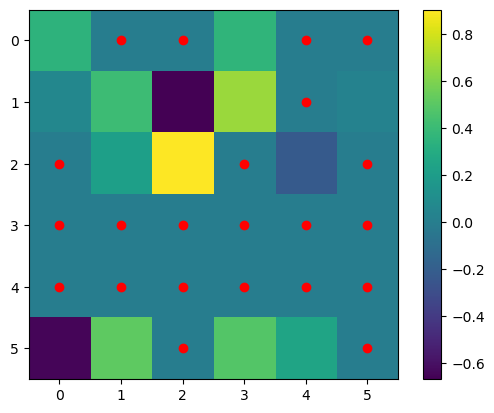

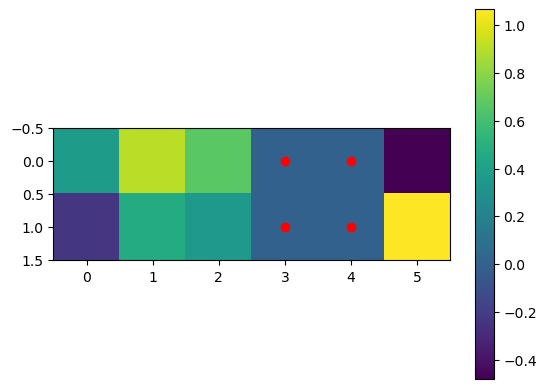

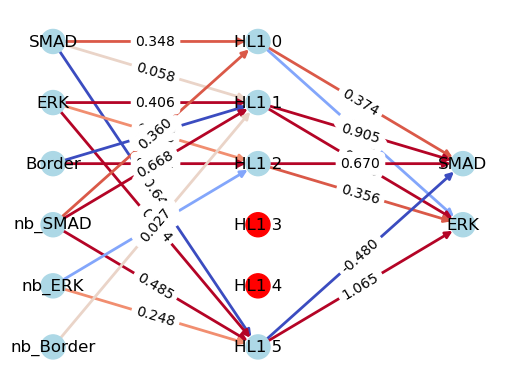

(1000, 9) (1000, 9)


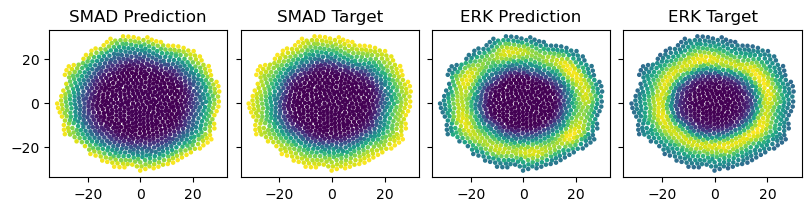

QUALITY before 4.592863292038409
QUALITY after 4.505531217078551
N-pruned 26
(1000, 9) (1000, 9)
[array([[-3.8429842e-04,  5.8309954e-01, -6.5408778e-01,  6.7895311e-01,
        -4.7290354e-04,  2.7955526e-02],
       [-6.4811458e-05, -8.3727879e-04,  1.9453932e-04, -1.7115088e-04,
         6.6178234e-04,  3.7134872e-05],
       [ 4.1079420e-05,  1.8434216e-03,  4.7068341e-05,  3.1885415e-05,
         8.8365414e-05,  7.1765702e-05],
       [ 8.4498686e-01, -2.4645255e-05, -3.0391741e-01, -8.6803600e-02,
        -7.7739256e-05, -1.6942101e-04],
       [-4.4566081e-04,  6.4320575e-06,  1.0139312e+00,  7.9417050e-02,
        -3.3116044e-04, -1.5393211e-04],
       [ 3.2000829e-04,  4.1839933e-01, -1.7320381e-04,  2.7772266e-04,
         3.6561099e-01,  2.2698063e-05]], dtype=float32), array([[ 6.4186358e-01, -1.4111910e-04,  6.4867279e-05,  6.7825824e-01,
         6.2378013e-01, -4.7301149e-01],
       [ 9.1583365e-01, -6.0684051e-06,  7.3707793e-05, -8.6140871e-01,
         3.3459914e-01

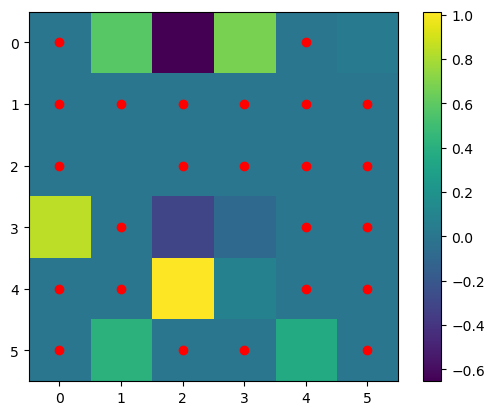

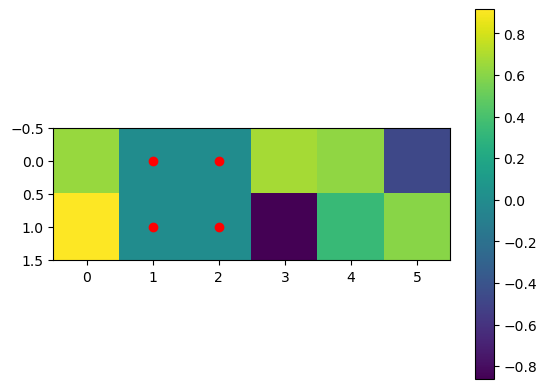

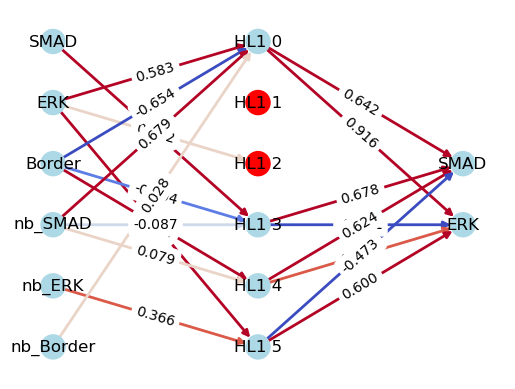

(1000, 9) (1000, 9)


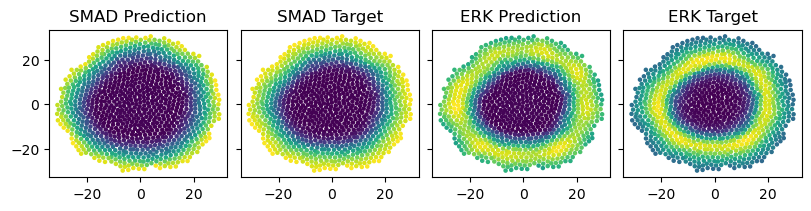

QUALITY before 6.420902154958621
QUALITY after 6.2984799726289555
N-pruned 28
(1000, 9) (1000, 9)
[array([[-7.3341304e-01, -1.7135261e-04,  1.2108394e-01,  5.6812525e-01,
         1.5495845e-02,  4.5930039e-02],
       [ 5.2952743e-01, -3.7828660e-05,  1.8100350e-01, -3.8103329e-04,
        -5.4654281e-04,  7.4080381e-06],
       [ 2.4633081e-01,  2.1549749e-01, -6.1295736e-01,  5.5464131e-01,
        -2.1834952e-01,  1.5643967e-02],
       [ 1.6124101e-05, -5.6620396e-05,  8.0647343e-01, -3.7451340e-05,
         3.7768639e-06, -1.0241521e-04],
       [-3.9349572e-05,  2.6741767e-05,  3.6796013e-05, -5.1312825e-05,
         1.5539347e-04,  1.1631798e-04],
       [-3.4018836e-03,  8.5739559e-01,  3.2704716e-05,  2.2149576e-04,
        -4.7240846e-06,  1.4912625e-04]], dtype=float32), array([[ 2.51253392e-03,  4.83231425e-01,  9.33648527e-01,
         6.17064595e-01, -2.61715543e-03, -3.44572691e-05],
       [ 2.16279364e+00,  2.42161026e-04,  2.85199087e-04,
         1.43735015e-05,  2.

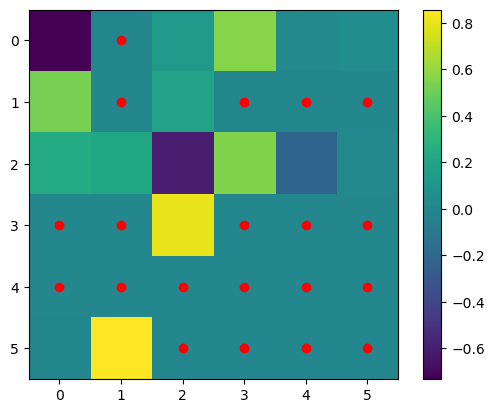

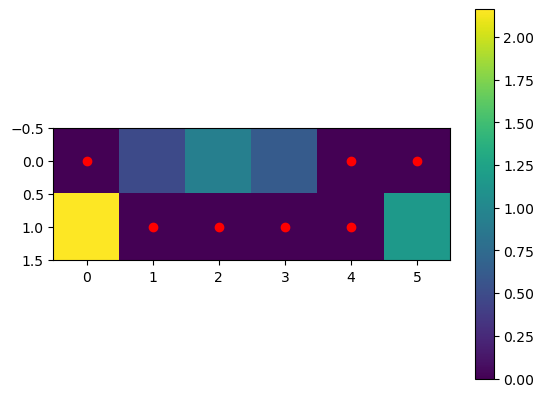

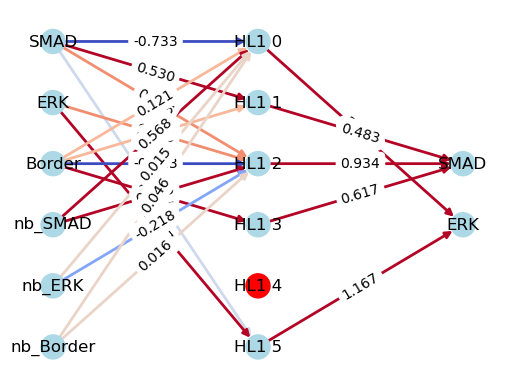

(1000, 9) (1000, 9)


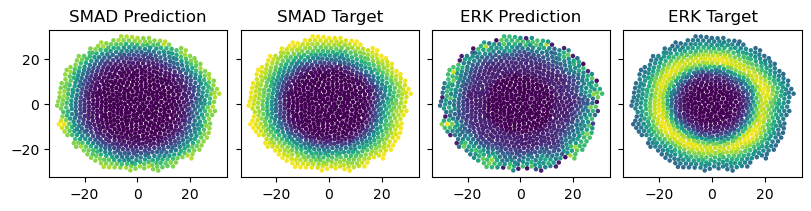

QUALITY before 7.101714332517448
QUALITY after 6.814678771353007
N-pruned 27
(1000, 8) (1000, 8)
[array([[-3.8779843e-05, -3.3352015e-05,  1.2007589e-04, -2.9347371e-05,
        -2.4164514e-05,  1.1713253e-04],
       [ 2.5828830e-03,  1.0817210e-03,  1.1257571e-04,  9.3509967e-05,
         1.4900400e-04,  1.1636041e-03],
       [ 6.2835134e-05, -5.0436820e-06,  5.3055650e-05,  1.8271233e-04,
        -2.7624215e-04, -5.2752272e-05],
       [-6.5349209e-01,  8.9800954e-01,  2.5948593e-01,  3.3668745e-01,
         1.6248167e-01, -3.4709464e-04],
       [ 2.9049891e-01, -8.7823981e-04, -7.7535146e-01,  6.8814576e-01,
        -5.8349001e-04,  3.2209985e-02],
       [ 3.1281763e-01, -2.9789133e-04,  7.6567847e-01,  3.6263891e-02,
        -5.9169583e-04, -7.5738353e-05]], dtype=float32), array([[ 5.0617260e-04, -4.2587726e-05,  9.0363325e-04,  9.2492690e-03,
         7.5312144e-01,  7.6270658e-01],
       [-3.4444552e-04,  1.8613508e-05,  2.2159117e-04,  9.4741446e-01,
         2.9781809e-01

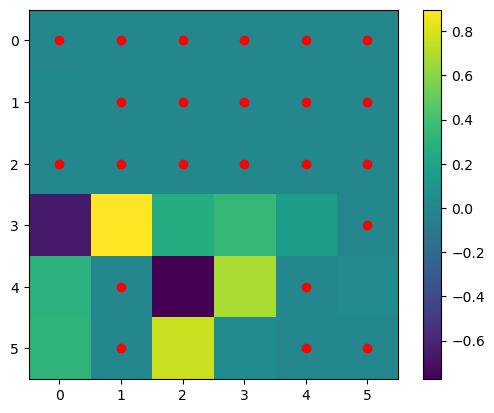

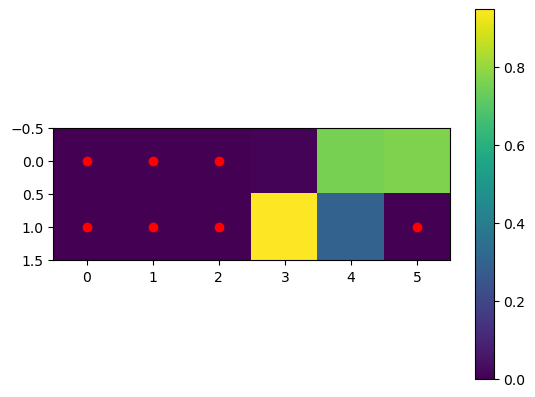

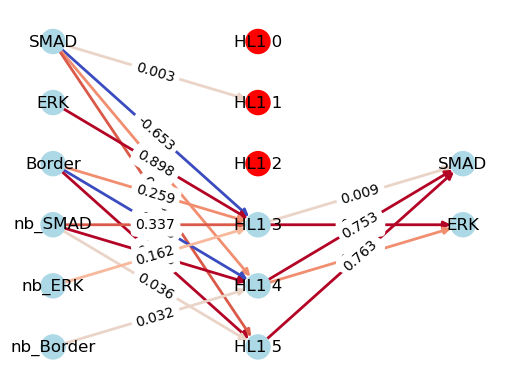

(1000, 8) (1000, 8)


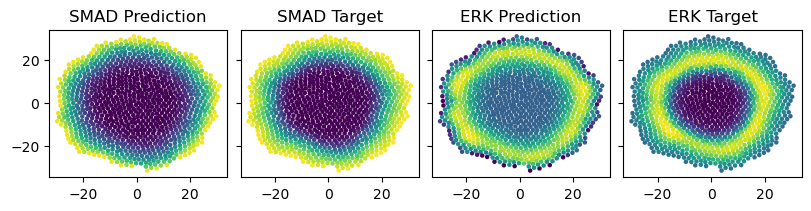

QUALITY before 6.582540858992131
QUALITY after 6.447651342299565
N-pruned 30
(1000, 9) (1000, 9)
[array([[-3.6662465e-01,  5.7562213e-02, -2.7885038e-04,  3.8185160e-04,
         3.2314099e-05,  4.5106229e-01],
       [-1.4113748e-04, -4.8557315e-05, -6.8017578e-04,  1.2969827e-04,
         6.3996026e-06,  8.4194369e-05],
       [-1.1441202e-03,  8.4954822e-01,  6.7708403e-01,  1.9281854e-01,
        -5.3079857e-04,  5.5025326e-04],
       [-1.8951851e-01,  4.2543196e-04,  5.7774621e-05,  2.2279848e-03,
         5.5451387e-01,  5.4331339e-04],
       [ 3.1320021e-02,  8.2464176e-05, -6.4173061e-01,  8.0087751e-01,
        -6.5808371e-04, -4.8541620e-05],
       [ 7.3567188e-01,  2.8716258e-05,  5.9595770e-01, -9.7259000e-04,
         1.8527018e-03,  4.7318370e-04]], dtype=float32), array([[ 5.4994452e-01, -8.9372596e-05,  2.1467814e-01, -3.4444028e-01,
         6.5139836e-01,  4.9515668e-01],
       [ 5.1466936e-01, -1.1053127e-05,  9.5347649e-01,  3.5394093e-01,
         4.1316968e-01

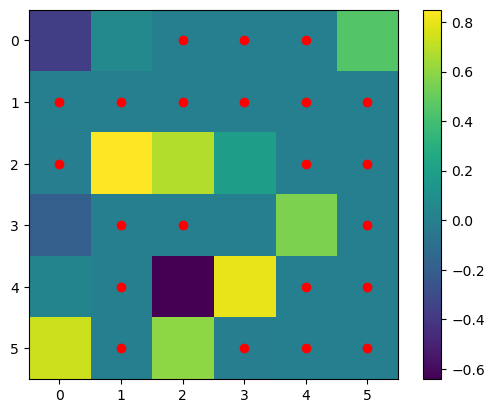

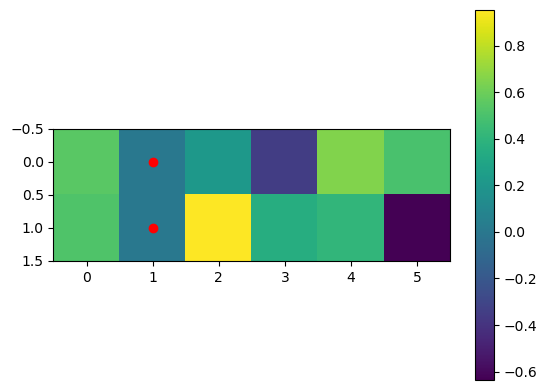

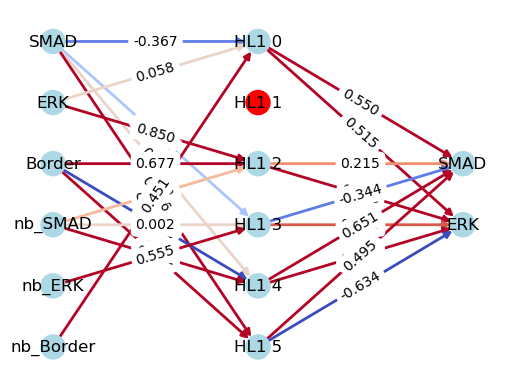

(1000, 8) (1000, 8)


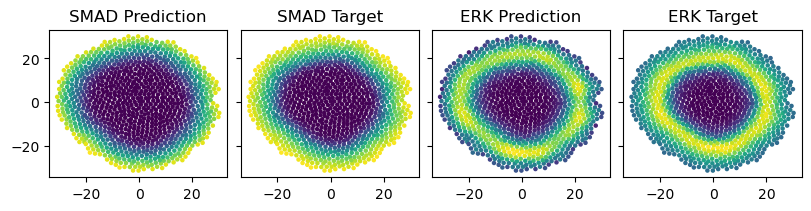

QUALITY before 5.410135799032026
QUALITY after 5.254120694854883
N-pruned 24
(1000, 8) (1000, 8)
[array([[-9.6701522e-05,  2.6184594e-04, -8.3221370e-05, -8.6599769e-04,
         2.8631071e-04, -4.3534827e-05],
       [ 3.0899072e-01, -6.9632129e-05, -6.1787556e-05,  2.1699208e-01,
         1.1571402e-03,  1.9648745e-05],
       [ 6.0977751e-01, -2.3562281e-04, -8.3796889e-01,  4.7973153e-01,
        -9.8138466e-04,  1.7836889e-02],
       [ 1.8151559e-01,  2.1389874e-02,  1.0375252e+00,  7.1774229e-02,
        -3.2117617e-04, -4.2908601e-04],
       [-4.3848303e-01,  5.2224350e-01, -1.8913488e-01,  5.3398651e-01,
         1.0451278e-01,  8.1763007e-03],
       [-4.0367198e-05, -6.8177309e-05, -3.7818219e-04, -1.5424008e-03,
        -7.0306967e-05, -4.0696887e-05]], dtype=float32), array([[ 6.5492161e-05, -1.3508953e-04,  7.6928693e-01,  6.2842393e-01,
        -3.6477449e-04,  3.4424779e-04],
       [ 9.3565744e-05, -4.2939642e-01, -4.0937364e-04,  2.9644558e-01,
         1.5813265e+00

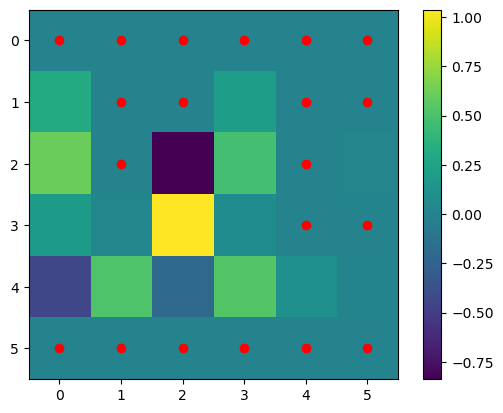

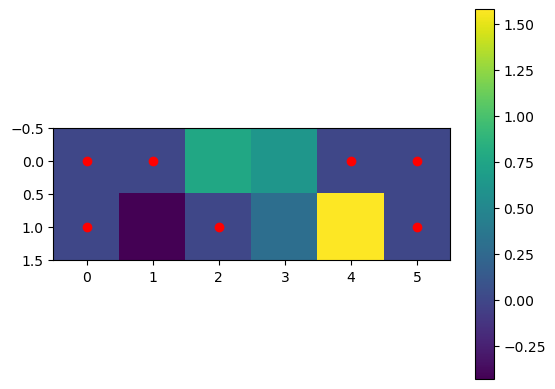

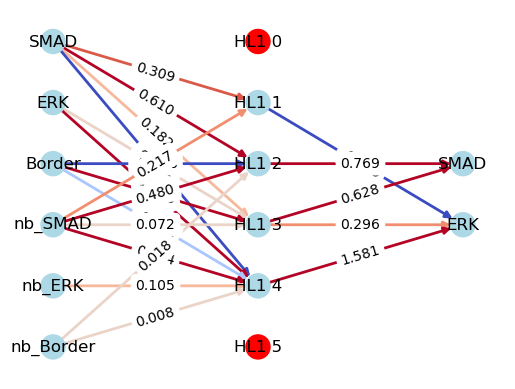

(1000, 9) (1000, 9)


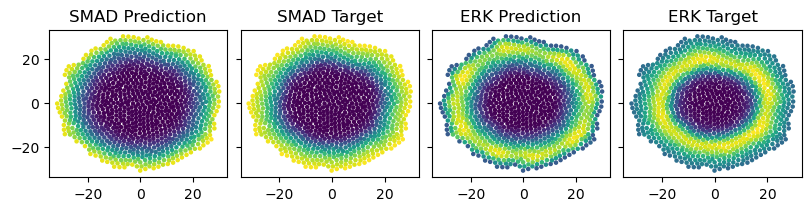

QUALITY before 6.400222443065645
QUALITY after 6.3174351797948
N-pruned 27
(1000, 8) (1000, 8)
[array([[-6.62313716e-04,  1.66335240e-01, -6.62594676e-01,
         8.01795304e-01, -4.64575220e-04,  2.91751642e-02],
       [-1.86851787e-04,  6.88079817e-05, -4.15384537e-04,
         1.56981513e-01,  1.68555824e-04,  1.28216743e-05],
       [ 3.47560883e-04,  2.95606256e-01,  2.18811601e-06,
         1.07614076e-04,  4.91633207e-01,  2.98538158e-04],
       [ 6.63345993e-01,  2.74555146e-04,  3.93594086e-01,
        -1.61775529e-01,  3.82799713e-04, -4.87961734e-06],
       [-6.28769631e-05, -7.12466717e-04,  2.87997100e-05,
        -2.08354613e-05,  2.21818073e-06, -4.91048326e-04],
       [-8.60650835e-06,  7.17799127e-01,  9.62163985e-01,
         2.25818265e-04, -1.55162008e-04,  1.19450875e-03]], dtype=float32), array([[ 8.0073601e-01,  3.2865581e-01, -4.5640510e-01,  6.2054431e-01,
         3.0350137e-05,  3.0782330e-01],
       [ 5.6642246e-01,  8.7501094e-06,  4.5562541e-01, -9.1

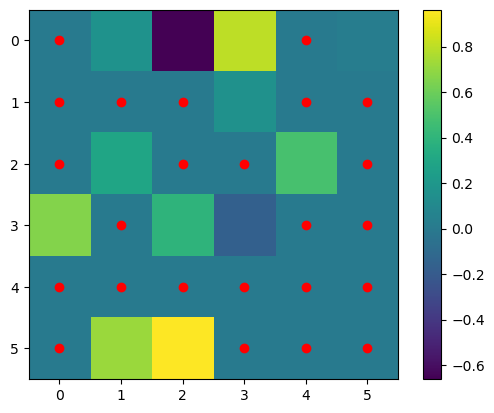

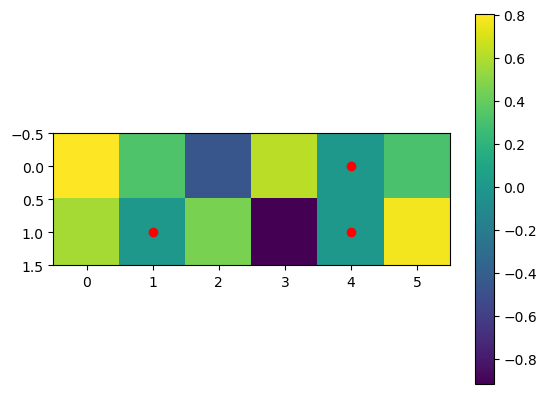

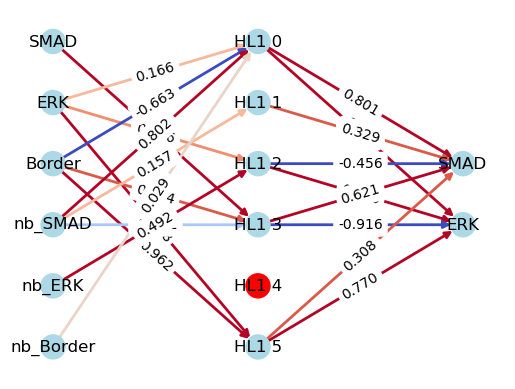

(1000, 9) (1000, 9)


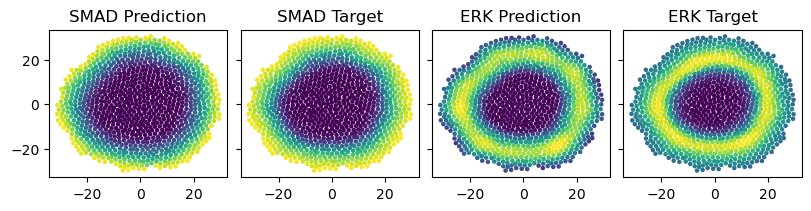

QUALITY before 4.594291385709609
QUALITY after 4.554343343817994
N-pruned 27
(1000, 9) (1000, 9)
[array([[-4.68786195e-04,  1.31006524e-01,  3.50548238e-01,
         4.51361746e-01, -1.30311225e-03,  1.29336705e-02],
       [ 3.75160220e-04,  2.18678950e-04,  6.32018328e-01,
        -7.77760208e-01,  2.67167488e-04,  1.28457061e-04],
       [-2.86304276e-03,  3.87248147e-05,  2.91611679e-04,
        -1.84857490e-04,  6.56112206e-06,  2.85710121e-05],
       [-5.17032385e-01,  5.88968575e-01,  1.11513735e-04,
         5.16705811e-01,  1.24595940e-01,  6.05556043e-03],
       [ 7.24400043e-01, -4.97956120e-04, -3.07348490e-01,
         3.71286005e-01, -1.03871532e-01,  3.68635432e-04],
       [ 8.91809614e-05,  2.14362117e-05,  1.26903687e-04,
        -1.35096343e-04,  1.32543873e-05, -1.40132761e-05]], dtype=float32), array([[ 5.7509041e-01,  6.1786038e-01,  2.2387617e-04, -4.3017510e-04,
         6.8022388e-01, -2.1301091e-04],
       [ 6.1855375e-05,  5.1453084e-01, -2.6053611e-05,  1

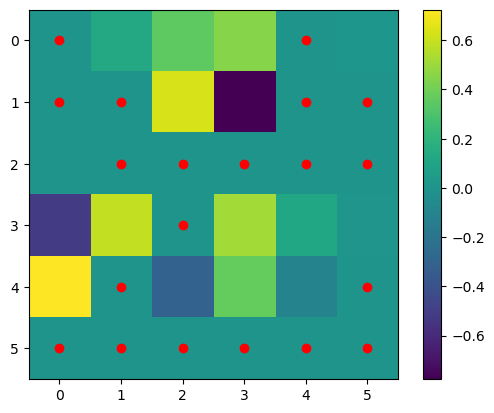

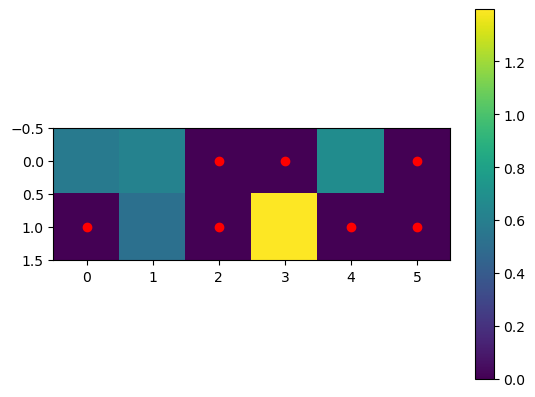

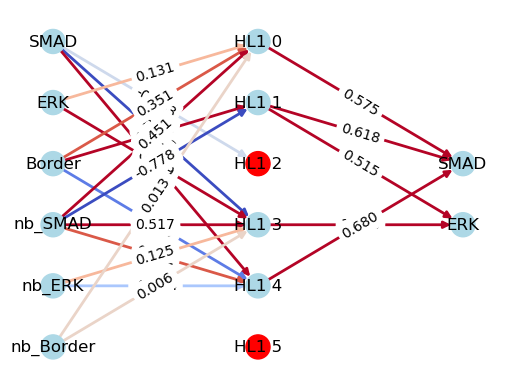

(1000, 9) (1000, 9)


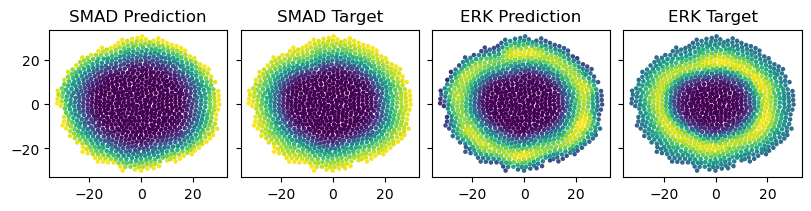

QUALITY before 5.727241115173877
QUALITY after 5.529294948783146
N-pruned 27
(1000, 9) (1000, 9)
[array([[ 1.73790118e-04, -8.13000734e-05, -2.89801810e-05,
         7.47058903e-06, -1.20759996e-05, -6.62013044e-05],
       [ 3.74375290e-04,  2.39623591e-01, -1.01227887e-01,
        -2.25854352e-01,  3.25607717e-01, -1.16642885e-04],
       [-1.19431323e-04,  8.82784724e-01,  7.73550719e-02,
         1.69559207e-04,  1.91793934e-01, -3.86200729e-04],
       [ 8.81162006e-04, -4.38229254e-05, -6.10219613e-05,
         8.72702512e-04, -4.31345747e-04,  1.86121455e-04],
       [ 6.34634972e-01, -7.12099354e-05,  4.43117432e-02,
         6.34754193e-04, -4.45323822e-04,  4.65313382e-02],
       [ 1.58969153e-04,  6.71346307e-01, -2.83568748e-04,
         5.89677155e-01,  1.87037745e-04,  8.30852464e-02]], dtype=float32), array([[ 2.70278761e-05, -1.06419194e+00,  2.99796283e-01,
         1.02346654e-04,  8.53110135e-01,  3.91678154e-01],
       [ 1.43654598e-03,  1.18056058e-04,  5.8072578

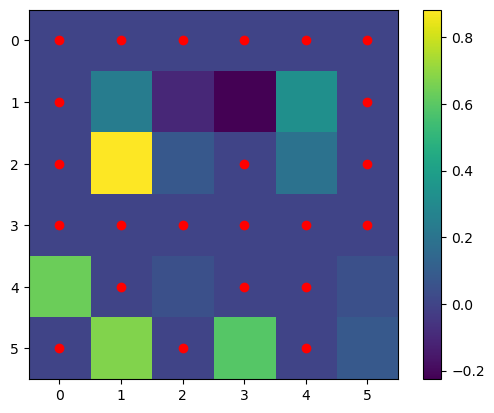

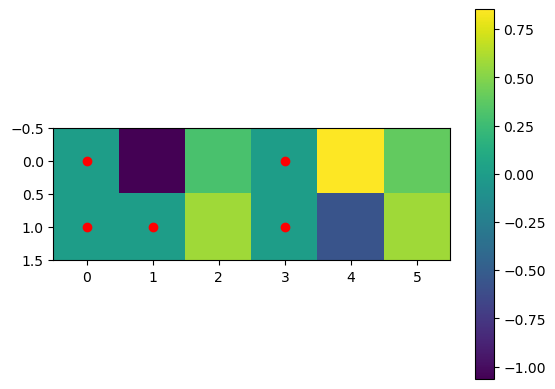

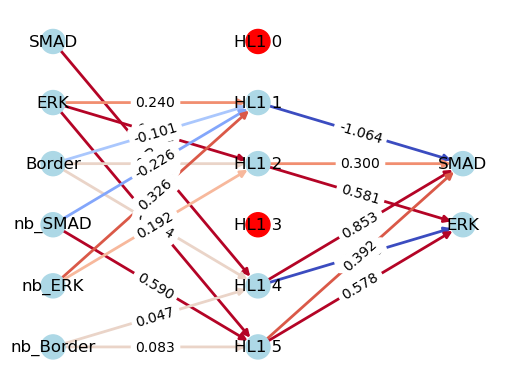

(1000, 9) (1000, 9)


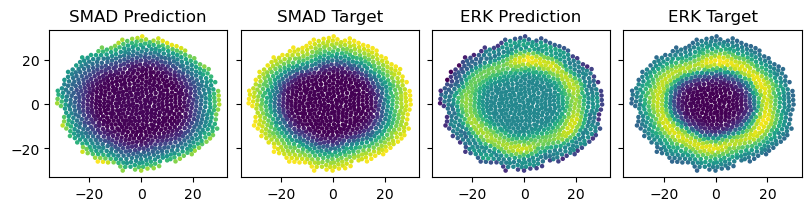

QUALITY before 10.802435110257095
QUALITY after 10.649102827002503
N-pruned 28


In [19]:

scores = []
for i in range(10):
    # load the model
    stepsize = 2

    path = f"model60{i}.pth"
    model = CustomGNN(3, [6], 2, aggregation="mean", biases = False)
    model.load_state_dict(torch.load(path))
    model.eval()



    qualb = get_quality(model, data, positions, stepsize, 0)
    scores.append(qualb)
    mask = prune(model, threshold = 0.01)
    w = model.get_weights()
    ww = [w.detach().numpy()*(~m) for w,m in zip(w, mask)]
    ww = [torch.nn.Parameter(torch.tensor(w)) for w in ww]
    model.set_weights(ww) 

    quala = get_quality(model, data, positions, stepsize, 1)
    print("QUALITY before", qualb)
    print("QUALITY after", quala)
    print("N-pruned", np.sum([np.sum(m) for m in mask]))

In [20]:
scores

[np.float64(5.07897816721553),
 np.float64(4.592863292038409),
 np.float64(6.420902154958621),
 np.float64(7.101714332517448),
 np.float64(6.582540858992131),
 np.float64(5.410135799032026),
 np.float64(6.400222443065645),
 np.float64(4.594291385709609),
 np.float64(5.727241115173877),
 np.float64(10.802435110257095)]

In [25]:
all_weights = []

for i in range(10):
    # load the model
    stepsize = 5

    path = f"model40{i}.pth"
    model = CustomGNN(3, [6], 2, aggregation="mean", biases = False)
    model.load_state_dict(torch.load(path))
    model.eval()

    weights = model.get_weights()

    all_weights.append([w.detach().numpy() for w in weights])

In [26]:
w1 = all_weights[0][0]

from itertools import permutations

final_weights = []
final_weights.append(w1)
for otherw in all_weights[1:]:
    w2 = otherw[0]

# try every permutation of w2 and find the one with the smallest distance
# permute w2
    w2_permuted = []


    for perm in permutations(range(len(w2))):
        w2_permuted.append(w2[list(perm)])

    w2_permuted = np.array(w2_permuted)


    distances = ((w1 - w2_permuted) ** 2).mean(axis = (1,2)) ** 0.5

    min_distance = np.min(distances)
    min_index = np.argmin(distances)

    print(min_distance)

    final_weights.append(w2_permuted[min_index])

# ((w1 - w2) ** 2).mean() ** 0.5
# find hamming distance


0.22152573
0.22002125
0.355741
0.30771774
0.40276447
0.2646665
0.33728078
0.3099221
0.40435737


In [28]:
len(final_weights)

10

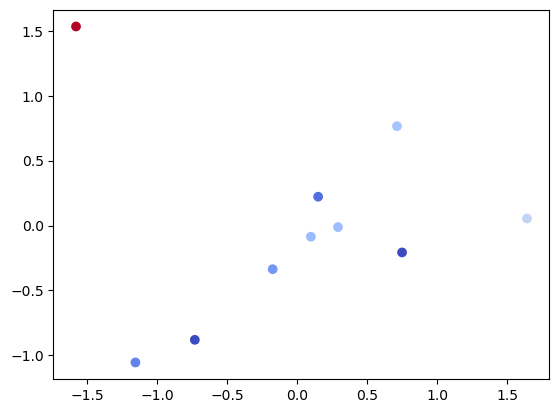

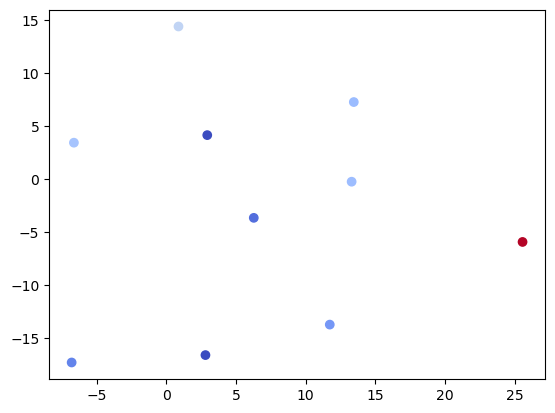

In [ ]:
# import a library that can do dimensionality reduction
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA


# reduce the dimensionality of the weights
pca = PCA(n_components=2)
tsne = TSNE(n_components=2, perplexity = 5)

reduced_weights = pca.fit_transform(np.array(final_weights).reshape(10, -1))
reduced_weights_tsne = tsne.fit_transform(np.array(final_weights).reshape(10, -1),)

# plot the reduced weights
plt.scatter(reduced_weights[:,0], reduced_weights[:,1], c = scores, cmap="coolwarm")
plt.title("PCA")
plt.show()

plt.scatter(reduced_weights_tsne[:,0], reduced_weights_tsne[:,1], c = scores, cmap="coolwarm")
plt.show()
